In [31]:
import numpy as np
d = np.load('color_dataset.npz')
X, y = d['X'], d['y']

In [32]:
from sklearn.linear_model import LogisticRegressionCV
clf = LogisticRegressionCV().fit(X, y)
clf.score(X, y)

0.8098272138228941

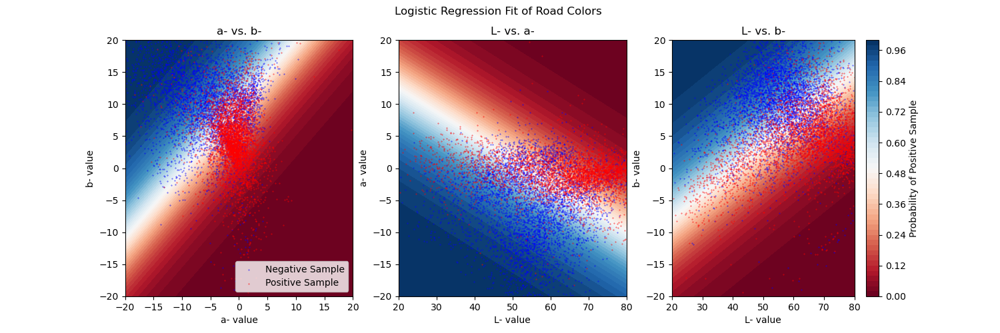

In [33]:
%matplotlib widget

import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 3, figsize=(15,5))
fig.suptitle('Logistic Regression Fit of Road Colors ')
v = (y == 0)
pos, neg = X[v, ...], X[~v, ...]
sz = 0.1  # point size

# Grid 1 -> Median L-, a- vs. b-
xx, yy = np.mgrid[-30:30:0.5, -30:30:0.5]
grid = np.c_[np.median(X[:, 0]).repeat(len(xx.ravel())), xx.ravel(), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[0].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[0].scatter(neg[:, 1], neg[:, 2], sz, 'b', label='Negative Sample')
ax[0].scatter(pos[:, 1], pos[:, 2], sz, 'r', label='Positive Sample')
ax[0].set_xlim(-20, 20)
ax[0].set_ylim(-20, 20)
ax[0].set_title('a- vs. b-')
ax[0].set_xlabel('a- value')
ax[0].set_ylabel('b- value')
ax[0].legend()

# Grid 2 -> L- vs. a-, median b-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[xx.ravel(), yy.ravel(), np.median(X[:, 2]).repeat(len(xx.ravel()))]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[1].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[1].scatter(neg[:, 0], neg[:, 1], sz, 'b')
ax[1].scatter(pos[:, 0], pos[:, 1], sz, 'r')
ax[1].set_xlim(20, 80)
ax[1].set_ylim(-20, 20)
ax[1].set_title('L- vs. a-')
ax[1].set_xlabel('L- value')
ax[1].set_ylabel('a- value')

# Grid 3 -> L- vs b-, median a-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[xx.ravel(), np.median(X[:, 1]).repeat(len(xx.ravel())), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
c = ax[2].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0., vmax=1.)
ax[2].scatter(neg[:, 0], neg[:, 2], sz, 'b')
ax[2].scatter(pos[:, 0], pos[:, 2], sz, 'r')
ax[2].set_xlim(20, 80)
ax[2].set_ylim(-20, 20)
ax[2].set_title('L- vs. b-')
ax[2].set_xlabel('L- value')
ax[2].set_ylabel('b- value')
fig.colorbar(c, ax=ax[2], label='Probability of Positive Sample')

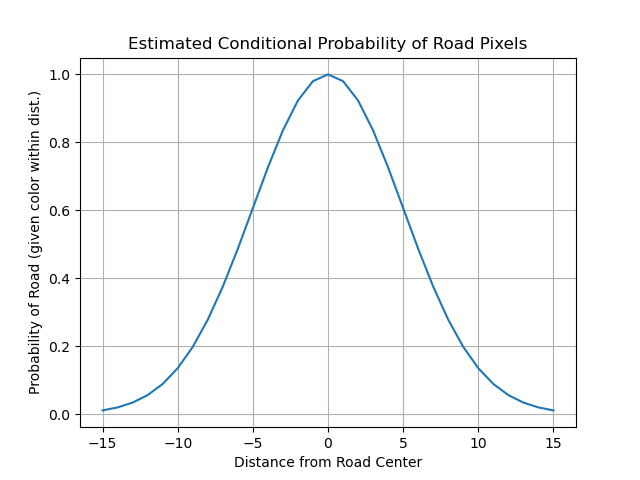

In [17]:
%matplotlib widget

from scipy.stats import norm

xlim = 15
sigma = xlim / 3
pdf_y = lambda x: norm.pdf(x, scale=sigma) * np.sqrt(2 * np.pi * sigma ** 2)

pdf_x = np.arange(-xlim, xlim + 1)
fig, ax = plt.subplots()
ax.plot(pdf_x, pdf_y(pdf_x))
ax.set_xlabel('Distance from Road Center')
ax.set_ylabel('Probability of Road (given color within dist.)')
ax.set_title('Estimated Conditional Probability of Road Pixels')
ax.grid()

In [18]:
import sqlite3
import pandas as pd
from IPython.display import display

# Connect to sqlite database and get all truthed roadways with no obscuration that are valid
with sqlite3.connect('file:/data/road_surface_classifier/features.sqlite3?mode=ro', uri=True) as con:
    cursor = con.cursor()
    cursor.execute("""
        SELECT osm_id, chip_path from features
        WHERE obscuration = 6 AND no_data = 0 and bad_detect = 0;
    """)
    rows = cursor.fetchall()

# Put this all in a dataframe
df = pd.DataFrame(rows, columns=['osm_id', 'chip_path']).set_index('osm_id')

# Load OSM features and extract WKT values for the OSM IDs from above
osm_df = pd.read_csv('/data/road_surface_classifier/features.csv')
osm_df = osm_df.set_index('osm_id').loc[df.index][['wkt', 'x', 'y']]

# Combine this with our original DataFrame to get a "super-duper" DataFrame with wkt values
df = pd.concat([df, osm_df], axis=1)
df = df.sample(10)
display(df)

,chip_path,wkt,x,y
osm_id,,,,
972081262,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-72.3814756 41.4524571,-72.3815337...",39181.976562,48921.691406
1067066362,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-80.3531474 34.7957639,-80.3534336...",36278.796875,52006.210938
219860380,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-72.4402278 41.4118279,-72.4404716...",39159.378906,48938.902344
210678155,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-76.4122233 39.6422177,-76.4122055...",37715.777344,49784.687500
816067532,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-79.4101326 34.2368579,-79.4097305...",36625.066406,52252.800781
210144982,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-72.1973675 41.5795037,-72.1973889...",39249.101562,48860.425781
198549602,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-111.8939351 40.7415864,-111.89393...",24796.152344,49270.152344
22085882,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-88.016928 41.80174,-88.016873 41....",33489.550781,48754.289062
696994198,/home/jon/data/road_surface_classifier/rsc_nai...,"LINESTRING (-71.735924 41.847538,-71.736237 41...",39413.960938,48729.089844


In [19]:
import sys; sys.path.append('..')
from osgeo import ogr
ogr.UseExceptions()

import PIL.Image
import PIL.ImageDraw

from data_prep.utils import wgs84_to_im

def create_mask(row, width=1):    
    # Get list of points from WKT
    geom = ogr.CreateGeometryFromWkt(row['wkt'])
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])
    lon_ar, lat_ar = pts[:, 0], pts[:, 1]

    # Convert to image-space x, y
    ix, iy = wgs84_to_im(lon_ar,
                            lat_ar,
                            row['x'],
                            row['y'],
                            z=17,
                            iw=256,
                            ih=256)

    # Load image
    im = np.array(PIL.Image.open(row['chip_path']))

    # Create a new image of the same shape, and draw a line
    # to create a mask
    mask = np.zeros((im.shape[0], im.shape[1]), dtype=np.uint8)
    mask_pil = PIL.Image.new('L', ((im.shape[1], im.shape[0])), color=0)
    d = PIL.ImageDraw.Draw(mask_pil)
    d.line(
        [(x, y) for x, y in zip(ix, iy)],     # type: ignore
        fill=255,
        width=width, # Original: 10,
        joint="curve")
    mask = np.array(mask_pil)
    return im, mask

100%|██████████| 10/10 [00:00<00:00, 14.42it/s]


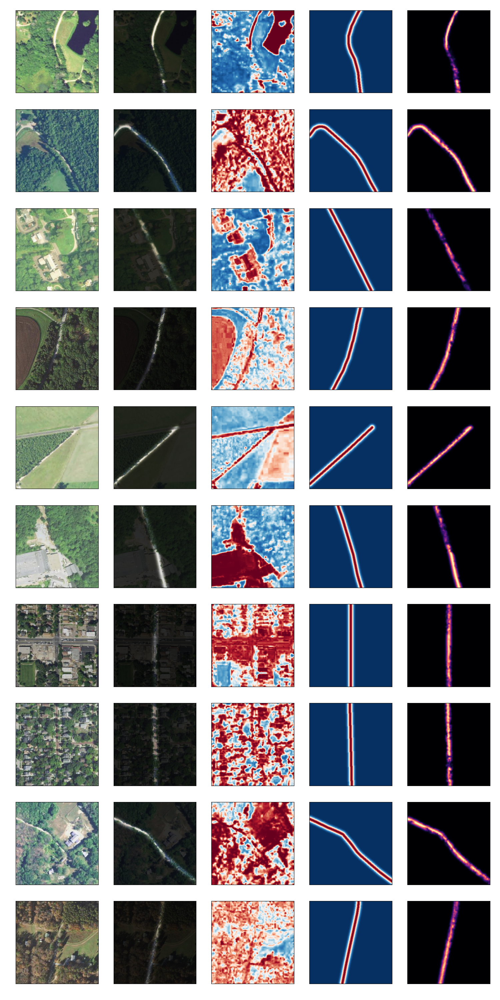

In [20]:
%matplotlib widget

from tqdm import tqdm
import scipy.ndimage
from scipy.special import erf
import skimage.color

rows, cols = 10, 5
fig, ax = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows), sharex=True, sharey=True)
fig.tight_layout()
for ax_ in ax.flatten():  # type: ignore
    ax_.get_xaxis().set_visible(False)
    ax_.get_yaxis().set_visible(False)

cmap = 'RdBu_r'

for idx in tqdm(range(len(df))):
    row = df.iloc[idx]

    im, mask = create_mask(row)
    ax[idx][0].imshow(im)

    im_lab = skimage.color.rgb2lab(im).reshape((-1, 3))
    pred = clf.predict_proba(im_lab)[:, 0]
    pred = pred.reshape((im.shape[0], im.shape[1]))
    pred = scipy.ndimage.gaussian_filter(pred, sigma=1)
    pred = np.power(pred, 1 / 4)

    ax[idx][2].imshow(pred, cmap=cmap, vmin=0, vmax=1)

    dist: np.ndarray = scipy.ndimage.distance_transform_edt(~mask)  # type: ignore
    dist_pdf = pdf_y(dist.reshape((-1,))).reshape(dist.shape)

    ax[idx][3].imshow(dist_pdf, cmap=cmap, vmin=0, vmax=1)

    ax[idx][4].imshow(pred * dist_pdf, cmap='magma', vmin=0, vmax=1)

    new_im = (im / 255.) * (0.2 + 0.8 * (pred * dist_pdf)[:, :, np.newaxis])

    ax[idx][1].imshow(new_im)




